In [1]:
import pandas as pd
import numpy as np
from datetime import datetime
import torch
from torch.utils.data import Dataset, DataLoader
import lightning as L
import matplotlib.pyplot as plt
import sklearn
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import RocCurveDisplay

In [2]:
pro_frames_merge = pd.read_csv('pro_frames_merge_2v2.csv', index_col = 0)
not_ol = ['HB', 'WR', 'FB']
pro_frames_merge = pro_frames_merge[(~pro_frames_merge['position_in'].isin(not_ol)) &
                                    (~pro_frames_merge['position_out'].isin(not_ol))]
for col in ('exchange','rush_win'):
    pro_frames_merge[col] = pro_frames_merge[col].astype('int64')

In [3]:
features = ['width_in','width_out', 
            'depth_in', 'depth_out',
            's_in','s_out',
            'a_in', 'a_out',
            'squareness_in', 'squareness_out',
            'open_outside_in', 'open_outside_out', 
            'moving_outside_in', 'moving_outside_out',
            'rotation_in', 'rotation_out',
            'rotation_outside_in', 'rotation_outside_out',
            'qb_o_rel_in', 'qb_o_rel_out',
            'qb_squareness_in', 'qb_squareness_out',
            'qb_dist_in', 'qb_dist_out',
            'x_diff', 'y_diff', 'dist', 'min_qb_dist', 'rel_rotation', 'penetrator_depth', 
            'mean_squareness', 'dev_squareness', 'max_squareness',
            'mean_qb_squareness', 'dev_qb_squareness', 'max_qb_squareness',
            #'position_combo', 
            'stunt_type', 'exchange']

In [4]:
df = pro_frames_merge[features + ['rush_win']]
corr_matrix = df.corr()
win_corr = corr_matrix['rush_win'][:-1]
corr_matrix

,width_in,width_out,depth_in,depth_out,s_in,s_out,a_in,a_out,squareness_in,squareness_out,...,rel_rotation,penetrator_depth,mean_squareness,dev_squareness,max_squareness,mean_qb_squareness,dev_qb_squareness,max_qb_squareness,exchange,rush_win
width_in,1.000000,0.409599,0.286259,0.267182,0.272691,0.162616,0.127429,0.043380,0.261811,0.151382,...,0.130700,0.286881,0.254487,0.245705,0.230017,0.352905,0.344814,0.319422,-0.051250,0.083447
width_out,0.409599,1.000000,-0.023143,-0.014172,-0.021385,0.070842,-0.003111,0.026459,-0.059217,-0.054640,...,-0.038996,-0.074704,-0.069713,-0.078092,-0.086897,0.053150,0.040811,0.020158,0.141283,0.001151
depth_in,0.286259,-0.023143,1.000000,0.816428,0.404349,0.396154,0.243229,0.121782,0.501489,0.492265,...,0.136651,0.864582,0.607971,0.606210,0.590071,0.543775,0.551233,0.543877,0.019548,0.107657
depth_out,0.267182,-0.014172,0.816428,1.000000,0.313542,0.433188,0.189474,0.167362,0.475412,0.528523,...,0.162065,0.872291,0.613205,0.612398,0.598341,0.529364,0.539736,0.535958,0.008957,0.136007
s_in,0.272691,-0.021385,0.404349,0.313542,1.000000,0.466675,0.072907,0.028667,0.415665,0.213144,...,0.044412,0.426260,0.387836,0.382142,0.367869,0.296924,0.302447,0.300337,-0.038433,0.112993
s_out,0.162616,0.070842,0.396154,0.433188,0.466675,1.000000,0.111476,0.037431,0.293643,0.368198,...,0.027319,0.469236,0.403623,0.400024,0.385719,0.291741,0.298085,0.298187,-0.064668,0.127802
a_in,0.127429,-0.003111,0.243229,0.189474,0.072907,0.111476,1.000000,0.080838,0.100214,0.126935,...,0.033786,0.219836,0.138508,0.143143,0.144739,0.098715,0.107006,0.116417,0.008049,0.033582
a_out,0.043380,0.026459,0.121782,0.167362,0.028667,0.037431,0.080838,1.000000,0.088216,0.009739,...,0.039164,0.145948,0.061164,0.068084,0.072816,0.053922,0.059863,0.067296,-0.062279,0.040464
squareness_in,0.261811,-0.059217,0.501489,0.475412,0.415665,0.293643,0.100214,0.088216,1.000000,0.336060,...,0.149621,0.550911,0.827776,0.828878,0.810288,0.628659,0.642509,0.645015,-0.111487,0.166708
squareness_out,0.151382,-0.054640,0.492265,0.528523,0.213144,0.368198,0.126935,0.009739,0.336060,1.000000,...,0.220575,0.544724,0.806610,0.785059,0.743809,0.564730,0.579912,0.582204,-0.050099,0.146944


In [5]:
i = 1
pair_list = []
for col in corr_matrix.iloc[:-1,1:-1].columns:
    corr_search = corr_matrix[col][:i]
    high_corrs = corr_search[corr_search.abs() >= 0.65]
    if len(high_corrs) > 0:
        pairs = list(zip([col]*len(high_corrs),high_corrs.index,high_corrs.values))
        pair_list = pair_list + pairs
    i += 1
pair_list

[('depth_out', 'depth_in', 0.8164277917314486),
 ('qb_squareness_in', 'squareness_in', 0.756056137769844),
 ('qb_dist_out', 'qb_dist_in', 0.7383149478327766),
 ('min_qb_dist', 'qb_dist_in', 0.8887616422771646),
 ('min_qb_dist', 'qb_dist_out', 0.8847617108821815),
 ('penetrator_depth', 'depth_in', 0.8645816442811668),
 ('penetrator_depth', 'depth_out', 0.872290520749693),
 ('mean_squareness', 'squareness_in', 0.827776078019463),
 ('mean_squareness', 'squareness_out', 0.806609964060364),
 ('mean_squareness', 'qb_squareness_in', 0.6826166418515913),
 ('mean_squareness', 'penetrator_depth', 0.6702377399779867),
 ('dev_squareness', 'squareness_in', 0.828877916522433),
 ('dev_squareness', 'squareness_out', 0.7850585253638401),
 ('dev_squareness', 'qb_squareness_in', 0.6794395973856935),
 ('dev_squareness', 'penetrator_depth', 0.6648522351093755),
 ('dev_squareness', 'mean_squareness', 0.9878532102635557),
 ('max_squareness', 'squareness_in', 0.810287654366009),
 ('max_squareness', 'squarenes

In [6]:
dfhc = pd.DataFrame(pair_list, columns = ['feat1','feat2','corr'])
chosen_features = ['penetrator_depth', 'mean_qb_squareness', 'min_qb_dist']
df_chosen = dfhc[(dfhc['feat1'].isin(chosen_features)) | (dfhc['feat2'].isin(chosen_features))]
removed_features = [feat for feat in (set(df_chosen['feat1']) | set(df_chosen['feat2'])) if feat not in chosen_features]
df_remaining = dfhc[(~dfhc['feat1'].isin(removed_features)) & (~dfhc['feat2'].isin(removed_features))]
df_remaining

,feat1,feat2,corr


In [7]:
features2 = [feat for feat in features if feat not in removed_features]
df = pro_frames_merge[features2 + ['rush_win']]
corr_matrix = df.corr()
features2

['width_in',
 'width_out',
 's_in',
 's_out',
 'a_in',
 'a_out',
 'squareness_in',
 'squareness_out',
 'open_outside_in',
 'open_outside_out',
 'moving_outside_in',
 'moving_outside_out',
 'rotation_in',
 'rotation_out',
 'rotation_outside_in',
 'rotation_outside_out',
 'qb_o_rel_in',
 'qb_o_rel_out',
 'x_diff',
 'y_diff',
 'dist',
 'min_qb_dist',
 'rel_rotation',
 'penetrator_depth',
 'mean_qb_squareness',
 'stunt_type',
 'exchange']

In [8]:
remove_features = ['a_in', 'a_out', 
                   'squareness_in', 'squareness_out',
                   'qb_o_rel_in', 'qb_o_rel_out',
                   'open_outside_in', 'open_outside_out',
                   'rotation_in', 'rotation_out',
                   'moving_outside_in', 'moving_outside_out',
                   'rotation_outside_in', 'rotation_outside_out',
                   #'rel_rotation',
                   'width_out', 'dist']
features3 = [feat for feat in features2 if feat not in remove_features]
features3

['width_in',
 's_in',
 's_out',
 'x_diff',
 'y_diff',
 'min_qb_dist',
 'rel_rotation',
 'penetrator_depth',
 'mean_qb_squareness',
 'stunt_type',
 'exchange']

In [9]:
pro_frames_merge_trunc = pro_frames_merge[pro_frames_merge['frame_from_snap'] < 33].copy()
stunt_dummies = pd.get_dummies(pro_frames_merge_trunc['stunt_type'])
pro_frames_merge_trunc = pd.concat((pro_frames_merge_trunc,stunt_dummies), axis = 1)
features3.extend(stunt_dummies.columns.tolist())
features3.remove('stunt_type')
features3

['width_in',
 's_in',
 's_out',
 'x_diff',
 'y_diff',
 'min_qb_dist',
 'rel_rotation',
 'penetrator_depth',
 'mean_qb_squareness',
 'exchange',
 'EE',
 'ET',
 'TE',
 'TT']

In [10]:
divider_dates = pd.date_range("2021/09/08", "2021/11/03", periods = 9).to_pydatetime().tolist()   
divider_ids = [int(date.strftime("%Y%m%d") + "00") for date in divider_dates]
divider_ids

[2021090800,
 2021091500,
 2021092200,
 2021092900,
 2021100600,
 2021101300,
 2021102000,
 2021102700,
 2021110300]

In [11]:
def game_to_week(gameId, divider_ids):
    for i in range(len(divider_ids)):
        if gameId < divider_ids[i]:
            return i
pro_frames_merge_trunc['week'] = pro_frames_merge_trunc['gameId'].apply(game_to_week, args = [divider_ids])

In [12]:
sequences = []
for index, group in pro_frames_merge_trunc.groupby(['gameId', 'playId', 'stuntId']):
    sequences.append((group[features3],group['rush_win'].max(),group['week'].max()))
sequences

[(    width_in  s_in  s_out  x_diff  y_diff  min_qb_dist  rel_rotation  \
  0       1.29  0.03   0.33    1.32    0.30     4.107286        -52.33   
  1       1.28  0.15   0.58    1.37    0.33     4.167733        -48.67   
  2       1.26  0.39   0.87    1.45    0.38     4.211662        -38.14   
  3       1.24  0.60   1.26    1.54    0.45     4.237594        -40.26   
  4       1.23  0.74   1.46    1.64    0.50     4.267552        -42.03   
  5       1.22  0.94   1.66    1.72    0.55     4.288415        -25.14   
  6       1.21  1.06   1.81    1.79    0.63     4.321342          8.82   
  7       1.23  1.16   1.74    1.80    0.65     4.374391         16.44   
  8       1.26  1.27   1.71    1.80    0.69     4.484752         20.18   
  9       1.30  1.40   1.68    1.77    0.70     4.544678         33.15   
  10      1.35  1.57   1.49    1.72    0.65     4.611225         19.99   
  11      1.41  1.83   1.35    1.62    0.55     4.634059         -0.27   
  12      1.41  1.98   1.22    1.59   

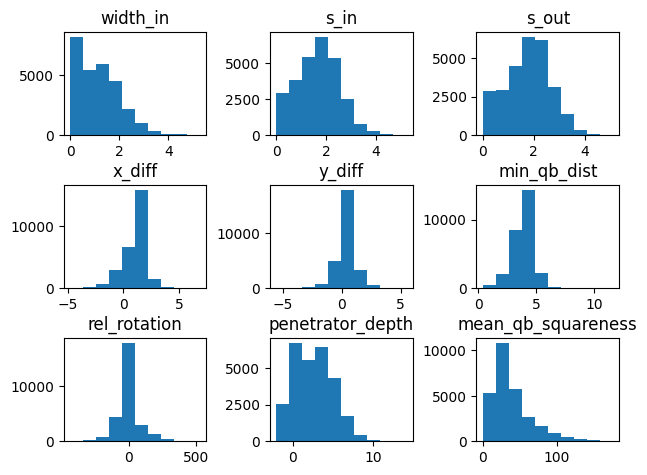

In [13]:
plot_cols = [feat for feat in features3 if pro_frames_merge_trunc[feat].dtype == 'float64']
len(plot_cols)
fig,ax = plt.subplots(3,3)
fig.tight_layout(pad = 1.5)
for i in range(0,3):
    for j in range(0,3):
        col = plot_cols[3*i+j]
        ax[i,j].hist(pro_frames_merge_trunc[col])
        ax[i,j].set_title(col)

In [14]:
pfmt_scaled = pro_frames_merge_trunc.copy()
standard_features = ['s_in', 's_out', 'x_diff','y_diff', 'min_qb_dist', 'rel_rotation', 'penetrator_depth']
for feat in features3:
    reshaped_array = pfmt_scaled[feat].values.reshape(-1,1)
    if feat in standard_features:
        pfmt_scaled[feat] = StandardScaler().fit_transform(reshaped_array)
    else:
        pfmt_scaled[feat] = MinMaxScaler().fit_transform(reshaped_array)
sequences_scaled = []
for index, group in pfmt_scaled.groupby(['gameId', 'playId', 'stuntId']):
    sequences_scaled.append((group[features3],group['rush_win'].max(),group['week'].max()))
sequences_scaled

[(    width_in      s_in     s_out    x_diff    y_diff  min_qb_dist  \
  0   0.243856 -1.951031 -1.635306  0.288500 -0.118772     0.275648   
  1   0.241966 -1.809663 -1.349733  0.337494 -0.082747     0.343221   
  2   0.238185 -1.526928 -1.018468  0.415885 -0.022706     0.392329   
  3   0.234405 -1.279536 -0.572974  0.504075  0.061352     0.421317   
  4   0.232514 -1.114607 -0.344515  0.602064  0.121393     0.454807   
  5   0.230624 -0.878995 -0.116056  0.680455  0.181435     0.478130   
  6   0.228733 -0.737627  0.055288  0.749047  0.277501     0.514939   
  7   0.232514 -0.619821 -0.024673  0.758846  0.301517     0.574242   
  8   0.238185 -0.490234 -0.058942  0.758846  0.349550     0.697613   
  9   0.245747 -0.337086 -0.093210  0.729449  0.361559     0.764603   
  10  0.255198 -0.136816 -0.310246  0.680455  0.301517     0.838996   
  11  0.266541  0.169480 -0.470167  0.582466  0.181435     0.864521   
  12  0.266541  0.346189 -0.618665  0.553070  0.073360     0.874342   
  13  

In [15]:
training_data = [seq for seq in sequences if seq[2] < 8]
test_data = [seq for seq in sequences if seq[2] == 8]

In [16]:
len(sequences), len(training_data), len(test_data)

(908, 809, 99)

In [17]:
class StuntDatasetSoft(Dataset):
    def __init__(self, sequences, sequence_length):
        self.sequences = sequences
        self.sequence_length = sequence_length
    def __len__(self):
        return len(self.sequences)
    def __getitem__(self, idx):
        sequence, label, week = self.sequences[idx]
        labels = np.repeat(label, self.sequence_length)
        if sequence.shape[0] > self.sequence_length:
            sequence = sequence.iloc[0:self.sequence_length]
        if sequence.shape[0] < self.sequence_length:
            padding = pd.DataFrame(sequence.iloc[-1:].copy())
            num_padded = self.sequence_length - sequence.shape[0]
            padding_rep = pd.DataFrame(np.repeat(padding.values, num_padded, axis=0)) 
            padding_rep.columns = sequence.columns
            sequence = pd.concat([sequence, padding_rep])

        label_tensor = torch.Tensor(labels).long()
        data_tensor = torch.Tensor(sequence.values)
            
        return data_tensor, label_tensor
class SequenceModelSoft(torch.nn.Module):
    def __init__(self, n_features, n_classes, n_hidden, n_layers):
        super().__init__()
        self.n_features = n_features
        self.n_classes = n_classes
        self.n_hidden = n_hidden
        self.n_layers = n_layers
        self.ltsm = torch.nn.LSTM(input_size = n_features, hidden_size = n_hidden, num_layers = n_layers, batch_first = True)
        self.classifier = torch.nn.Linear(n_hidden, n_classes)
    def forward(self, x):
        unfolded_hiddens, (_, _) = self.ltsm(x)
        fc_output = self.classifier(unfolded_hiddens)
        return fc_output
    def get_layer_probabilities(self, x):
        fc_output = self.forward(x)
        fc_output_long = fc_output.view([x.size(0) * x.size(1), self.n_classes])
        time_prob = torch.nn.functional.softmax(fc_output_long, dim = 1).detach().cpu().numpy().tolist()
        time_prob_win = [x[1] for x in time_prob]
        return time_prob_win

def train_model_soft(data_loader, model, loss_function, optimizer, time_frame_len = 3):
    num_batches = len(data_loader)
    total_loss = 0
    model.train()
    
    seq_len = data_loader.dataset.sequence_length
    probs = []
    labels = []
    time_frame_losses = {}
    time_frame_labels = {}
    time_frame_probs = {}
    i = 0
    for X, y in data_loader:
        i += 1
        fc_output = model(X)
        fc_output_long = fc_output.view([seq_len * X.size(0), model.n_classes])
        y_long = y.view([seq_len * X.size(0)])
        batch_probs = model.get_layer_probabilities(X)
        probs.extend(batch_probs)
        labels.extend(y_long.numpy())
        loss = loss_function(fc_output_long, y_long)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        time_frame_start = 0              
        if data_loader.dataset.sequence_length%time_frame_len != 0:
            print('Pick a sequence length divisable by {}'.format(time_frame_len))
            return None
        for time_frames in range(int(data_loader.dataset.sequence_length / time_frame_len)):
            time_frames += 1
            time_frame_end = time_frame_start + time_frame_len
            this_time_frame_probs = [batch_probs[i] for i in range(len(batch_probs)) 
                                     if i%seq_len in range(time_frame_start, time_frame_end)]
            this_time_frame_fc_output = fc_output[:, time_frame_start : time_frames*time_frame_len,
                                                  :].reshape([X.size(0) * time_frame_len, 2])
            this_time_frame_ys = y[:, time_frame_start : time_frames*time_frame_len].reshape([X.size(0) * time_frame_len])
            loss_this_time_frame = loss_function(this_time_frame_fc_output, this_time_frame_ys)
            if i == 1:
                time_frame_losses.update({str(time_frames) : [loss_this_time_frame.item()]})
                time_frame_labels.update({str(time_frames) : this_time_frame_ys.detach().cpu().numpy().tolist()})
                time_frame_probs.update({str(time_frames) : this_time_frame_probs})
            else:
                time_frame_losses[str(time_frames)].extend([loss_this_time_frame.item()])
                time_frame_labels[str(time_frames)].extend(this_time_frame_ys.detach().cpu().numpy().tolist())
                time_frame_probs[str(time_frames)].extend(this_time_frame_probs)
            time_frame_start = time_frame_end

    avg_loss = total_loss / num_batches
    fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_true = labels, y_score = probs, pos_label = 1)
    auc = sklearn.metrics.auc(fpr, tpr)
    print(f"Overall Train loss: {avg_loss} , Overall Train AUC: {auc}")

    for time_period in time_frame_losses.keys():
        losses = time_frame_losses[time_period]
        labels = time_frame_labels[time_period]
        probs_tp = time_frame_probs[time_period]
        
        avg_loss = sum(losses) / num_batches
        fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_true = labels, y_score = probs_tp, pos_label = 1)
        auc = sklearn.metrics.auc(fpr, tpr)
        print(f"Train loss for period {time_period}: {avg_loss} , Train AUC for period {time_period}: {auc}")

    return model

def test_model_soft(data_loader, model, loss_function, time_frame_len = 3):
    
    num_batches = len(data_loader)
    total_loss = 0
    model.eval()
    
    seq_len = data_loader.dataset.sequence_length
    time_frame_losses = {}
    time_frame_labels = {}
    time_frame_probs = {}
    i = 0
    with torch.no_grad():
        probs = []
        labels = []
        for X, y in data_loader:
            i += 1
            fc_output = model(X)
            fc_output_long = fc_output.view([seq_len * X.size(0), model.n_classes])
            y_long = y.view([seq_len * X.size(0)])
            batch_probs = model.get_layer_probabilities(X)
            probs.extend(batch_probs)
            labels.extend(y_long.numpy())
            total_loss += loss_function(fc_output_long, y_long).item()

            time_frame_start = 0
            if data_loader.dataset.sequence_length%time_frame_len != 0:
                print('Pick a sequence length divisable by {}'.format(time_frame_len))
                return None
            for time_frames in range(int(data_loader.dataset.sequence_length / time_frame_len)):
                time_frames += 1
                time_frame_end = time_frame_start + time_frame_len
                this_time_frame_probs = [batch_probs[i] for i in range(len(batch_probs)) 
                         if i%seq_len in range(time_frame_start, time_frame_end)]
                this_time_frame_fc_output = fc_output[:, time_frame_start : time_frames*time_frame_len,
                                                      :].reshape([X.size(0) * time_frame_len, 2])
                this_time_frame_ys = y[:, time_frame_start : time_frames*time_frame_len].reshape([X.size(0) * time_frame_len])
                loss_this_time_frame = loss_function(this_time_frame_fc_output, this_time_frame_ys)
                if i == 1:
                    time_frame_losses.update({str(time_frames) : [loss_this_time_frame.item()]})
                    time_frame_labels.update({str(time_frames) : this_time_frame_ys.detach().cpu().numpy().tolist()})
                    time_frame_probs.update({str(time_frames) : this_time_frame_probs})
                else:
                    time_frame_losses[str(time_frames)].extend([loss_this_time_frame.item()])
                    time_frame_labels[str(time_frames)].extend(this_time_frame_ys.detach().cpu().numpy().tolist())
                    time_frame_probs[str(time_frames)].extend(this_time_frame_probs)
                time_frame_start = time_frame_end

    avg_loss = total_loss / num_batches
    fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_true = labels, y_score = probs, pos_label = 1)
    auc = sklearn.metrics.auc(fpr, tpr)
    print(f"Overall test loss: {avg_loss} , Overall test AUC: {auc}")

    for time_period in time_frame_losses.keys():
        losses = time_frame_losses[time_period]
        labels = time_frame_labels[time_period]
        probs_tp = time_frame_probs[time_period]
        
        avg_loss = sum(losses) / num_batches
        fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_true = labels, y_score = probs_tp, pos_label = 1)
        auc = sklearn.metrics.auc(fpr, tpr)
        print(f"Test loss for period {time_period}: {avg_loss} , Test AUC for period {time_period}: {auc}")
        
def train_rush_lstm_soft(train_loader, test_loader, model, loss_function, optimizer, num_epochs = 10):
    for ix_epoch in range(num_epochs):
        print(f"Epoch {ix_epoch}\n---------")
        model = train_model_soft(train_loader, model, loss_function, optimizer=optimizer)
        test_model_soft(test_loader, model, loss_function)
        print()
    return(model)

In [18]:
class StuntDatasetSig(Dataset):
    def __init__(self, sequences, sequence_length):
        self.sequences = sequences
        self.sequence_length = sequence_length
    def __len__(self):
        return len(self.sequences)
    def __getitem__(self, idx):
        sequence, label, week = self.sequences[idx]
        labels = np.repeat(label, self.sequence_length)
        if sequence.shape[0] > self.sequence_length:
            sequence = sequence.iloc[0:self.sequence_length]
        if sequence.shape[0] < self.sequence_length:
            padding = pd.DataFrame(sequence.iloc[-1:].copy())
            num_padded = self.sequence_length - sequence.shape[0]
            padding_rep = pd.DataFrame(np.repeat(padding.values, num_padded, axis=0)) 
            padding_rep.columns = sequence.columns
            sequence = pd.concat([sequence, padding_rep])

        label_tensor = torch.Tensor(labels)
        data_tensor = torch.Tensor(sequence.values)
            
        return data_tensor, label_tensor
class SequenceModelSig(torch.nn.Module):
    def __init__(self, n_features, n_hidden, n_layers):
        super().__init__()
        self.n_features = n_features
        self.n_hidden = n_hidden
        self.n_layers = n_layers
        self.ltsm = torch.nn.LSTM(input_size = n_features, hidden_size = n_hidden, num_layers = n_layers, batch_first = True)
        self.classifier = torch.nn.Linear(n_hidden, 1)
        self.sigmoid = torch.nn.Sigmoid()
    def forward(self, x):
        unfolded_hiddens, (_, _) = self.ltsm(x)
        fc_output = self.classifier(unfolded_hiddens)
        return self.sigmoid(fc_output)

def train_model_sig(data_loader, model, loss_function, optimizer, time_frame_len = 3):
    num_batches = len(data_loader)
    total_loss = 0
    model.train()
    
    outputs = []
    labels = []
    time_frame_losses = {}
    time_frame_labels = {}
    time_frame_fc_outputs = {}
    i = 0
    for X, y in data_loader:
        i += 1
        fc_output = model(X)
        fc_output_long = fc_output.view([data_loader.dataset.sequence_length * X.size(0)])
        y_long = y.view([data_loader.dataset.sequence_length * X.size(0)])
        outputs.extend(fc_output_long.detach().numpy().tolist())
        labels.extend(y_long.numpy())
        loss = loss_function(fc_output_long, y_long)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        time_frame_start = 0
        if data_loader.dataset.sequence_length%time_frame_len != 0:
            print('Pick a sequence length divisable by {}'.format(time_frame_len))
            return None
        for time_frames in range(int(data_loader.dataset.sequence_length / time_frame_len)):
            time_frames += 1
            this_time_frame_fc_output = fc_output[:, time_frame_start : time_frames*time_frame_len,
                                                  :].reshape([X.size(0) * time_frame_len])
            this_time_frame_ys = y[:, time_frame_start : time_frames*time_frame_len].reshape([X.size(0) * time_frame_len])
            loss_this_time_frame = loss_function(this_time_frame_fc_output, this_time_frame_ys)
            if i == 1:
                time_frame_losses.update({str(time_frames) : [loss_this_time_frame.item()]})
                time_frame_labels.update({str(time_frames) : this_time_frame_ys.detach().cpu().numpy().tolist()})
                time_frame_fc_outputs.update({str(time_frames) : this_time_frame_fc_output.detach().cpu().numpy().tolist()})
            else:
                time_frame_losses[str(time_frames)].extend([loss_this_time_frame.item()])
                time_frame_labels[str(time_frames)].extend(this_time_frame_ys.detach().cpu().numpy().tolist())
                time_frame_fc_outputs[str(time_frames)].extend(this_time_frame_fc_output.detach().cpu().numpy().tolist())
            time_frame_start = time_frame_start + time_frame_len

    avg_loss = total_loss / num_batches
    fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_true = labels, y_score = outputs, pos_label = 1)
    auc = sklearn.metrics.auc(fpr, tpr)
    print(f"Overall Train loss: {avg_loss} , Overall Train AUC: {auc}")

    for time_period in time_frame_losses.keys():
        losses = time_frame_losses[time_period]
        labels = time_frame_labels[time_period]
        outputs_fc = time_frame_fc_outputs[time_period]
        
        avg_loss = sum(losses) / num_batches
        fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_true = labels, y_score = outputs_fc, pos_label = 1)
        auc = sklearn.metrics.auc(fpr, tpr)
        print(f"Train loss for period {time_period}: {avg_loss} , Train AUC for period {time_period}: {auc}")

    return model

def test_model_sig(data_loader, model, loss_function, time_frame_len = 3):
    
    num_batches = len(data_loader)
    total_loss = 0

    model.eval()
    i = 0
    time_frame_losses = {}
    time_frame_labels = {}
    time_frame_fc_outputs = {}
    with torch.no_grad():
        outputs = []
        labels = []
        for X, y in data_loader:
            i += 1
            fc_output = model(X)
            fc_output_long = fc_output.view([data_loader.dataset.sequence_length * X.size(0)])
            y_long = y.view([data_loader.dataset.sequence_length * X.size(0)])
            outputs.extend(fc_output_long.detach().numpy().tolist())
            labels.extend(y_long.numpy())
            total_loss += loss_function(fc_output_long, y_long).item()

            time_frame_start = 0
            if data_loader.dataset.sequence_length%time_frame_len != 0:
                print('Pick a sequence length divisable by {}'.format(time_frame_len))
                return None
            for time_frames in range(int(data_loader.dataset.sequence_length / time_frame_len)):
                time_frames += 1
                this_time_frame_fc_output = fc_output[:, time_frame_start : time_frames*time_frame_len,
                                                      :].reshape([X.size(0) * time_frame_len])
                this_time_frame_ys = y[:, time_frame_start : time_frames*time_frame_len].reshape([X.size(0) * time_frame_len])
                loss_this_time_frame = loss_function(this_time_frame_fc_output, this_time_frame_ys)
                if i == 1:
                    time_frame_losses.update({str(time_frames) : [loss_this_time_frame.item()]})
                    time_frame_labels.update({str(time_frames) : this_time_frame_ys.detach().cpu().numpy().tolist()})
                    time_frame_fc_outputs.update({str(time_frames) : this_time_frame_fc_output.detach().cpu().numpy().tolist()})
                else:
                    time_frame_losses[str(time_frames)].extend([loss_this_time_frame.item()])
                    time_frame_labels[str(time_frames)].extend(this_time_frame_ys.detach().cpu().numpy().tolist())
                    time_frame_fc_outputs[str(time_frames)].extend(this_time_frame_fc_output.detach().cpu().numpy().tolist())
                time_frame_start = time_frame_start + time_frame_len

    avg_loss = total_loss / num_batches
    fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_true = labels, y_score = outputs, pos_label = 1)
    auc = sklearn.metrics.auc(fpr, tpr)
    print(f"Overall test loss: {avg_loss} , Overall test AUC: {auc}")

    for time_period in time_frame_losses.keys():
        losses = time_frame_losses[time_period]
        labels = time_frame_labels[time_period]
        outputs_fc = time_frame_fc_outputs[time_period]
        
        avg_loss = sum(losses) / num_batches
        fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_true = labels, y_score = outputs_fc, pos_label = 1)
        auc = sklearn.metrics.auc(fpr, tpr)
        print(f"Test loss for period {time_period}: {avg_loss} , Test AUC for period {time_period}: {auc}")
        
def train_rush_lstm_sig(train_loader, test_loader, model, loss_function, optimizer, num_epochs = 10):
    for ix_epoch in range(num_epochs):
        print(f"Epoch {ix_epoch}\n---------")
        model = train_model_sig(train_loader, model, loss_function, optimizer=optimizer)
        test_model_sig(test_loader, model, loss_function)
        print()
    return(model)

In [292]:
torch.manual_seed(0)
train_dataset = StuntDatasetSoft(training_data, sequence_length = 33)
train_loader = DataLoader(train_dataset, batch_size = 50, shuffle = True)
test_dataset = StuntDatasetSoft(test_data, sequence_length = 33)
test_loader = DataLoader(test_dataset, batch_size = 50, shuffle = True)
model = SequenceModelSoft(n_features = training_data[0][0].shape[1],
                      n_classes = 2,
                      n_hidden = 15,
                      n_layers = 1
                      )
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr= 0.01)
batches = [X for X in train_loader]
X = batches[0][0]
y = batches[0][1]
fc_output = model(X)

In [290]:
fc_output_long = fc_output.view([X.size(0) * X.size(1), model.n_classes])
time_prob = torch.nn.functional.softmax(fc_output_long, dim = 1).detach() #.cpu().numpy().tolist()
time_prob_win = time_prob[:,1]
time_prob_win

tensor([0.6682, 0.6912, 0.7038,  ..., 0.4784, 0.4784, 0.4784])

In [296]:
probs = model.get_layer_probabilities(X)
seq_len = 33
time_frame_len = 3
time_frame_start = 12
time_frame_end = time_frame_start + time_frame_len
this_time_frame_probs = [probs[i] for i in range(len(probs))
                        if i%seq_len in range(time_frame_start, time_frame_end)]
torch.tensor(this_time_frame_probs)

tensor([0.7034, 0.6824, 0.6673, 0.4061, 0.4127, 0.4251, 0.5211, 0.4780, 0.4784,
        0.4085, 0.4099, 0.4184, 0.6019, 0.5671, 0.5585, 0.6845, 0.6812, 0.5900,
        0.5479, 0.5248, 0.4807, 0.6636, 0.5259, 0.4675, 0.5683, 0.5780, 0.5836,
        0.5522, 0.5897, 0.6117, 0.5730, 0.5752, 0.5762, 0.5098, 0.4799, 0.4742,
        0.5966, 0.5905, 0.5588, 0.4485, 0.4415, 0.4401, 0.5586, 0.5525, 0.5650,
        0.5592, 0.5654, 0.5754, 0.5615, 0.5639, 0.5610, 0.4266, 0.4320, 0.4204,
        0.4420, 0.4262, 0.4141, 0.5695, 0.5580, 0.5503, 0.6934, 0.6174, 0.5933,
        0.5545, 0.5554, 0.5644, 0.5053, 0.4668, 0.4466, 0.4699, 0.4715, 0.4722,
        0.4109, 0.4536, 0.4603, 0.4502, 0.4517, 0.4461, 0.4311, 0.4206, 0.4170,
        0.5538, 0.5649, 0.5716, 0.6038, 0.6847, 0.6258, 0.5609, 0.5615, 0.5629,
        0.4424, 0.4448, 0.4442, 0.6032, 0.5815, 0.5604, 0.5764, 0.5851, 0.5849,
        0.5486, 0.5107, 0.4735, 0.4528, 0.4552, 0.4553, 0.4693, 0.4714, 0.4702,
        0.5992, 0.5302, 0.4643, 0.4678, 

In [187]:
fc_output_long = fc_output.view([train_loader.dataset.sequence_length * X.size(0), model.n_classes])
y_long = y.view([train_loader.dataset.sequence_length * X.size(0)])
outputs = [x[0] for x in fc_output_long.detach().numpy().tolist()]
labels = y_long.numpy()
loss = loss_function(fc_output_long, y_long)
optimizer.zero_grad()
loss.backward()
optimizer.step()
total_loss = loss.item()

In [228]:
outputs = [x[0] for x in fc_output_long.detach().numpy().tolist()]
len(outputs)

1650

(0.5196325712854638,
 <sklearn.metrics._plot.roc_curve.RocCurveDisplay at 0x19f27be89a0>)

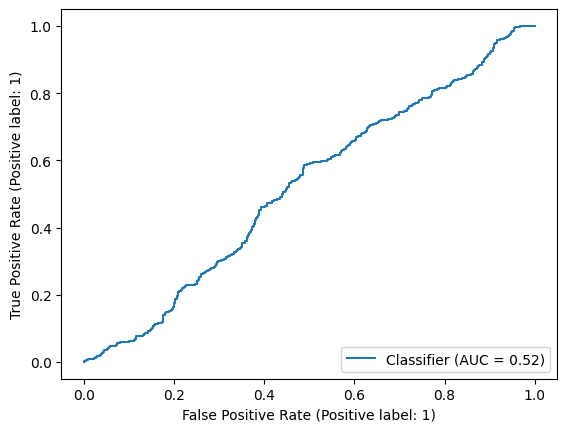

In [229]:
fpr, tpr, thresholds = sklearn.metrics.roc_curve(y_true = labels, y_score = outputs, pos_label = 1)
auc = sklearn.metrics.auc(fpr, tpr)
auc, RocCurveDisplay.from_predictions(labels, outputs)

In [195]:
this_time_frame_fc_output = fc_output[:, 0:5, :].reshape([X.size(0) * 5, 2])
this_time_frame_ys = y[:, 0:5].reshape([X.size(0) * 5])
loss_this_time_frame = loss_function(this_time_frame_fc_output, this_time_frame_ys)
loss_this_time_frame

tensor(0.7884, grad_fn=<NllLossBackward0>)

In [266]:
torch.manual_seed(0)
model = SequenceModelSig(n_features = training_data[0][0].shape[1],
                      n_hidden = 15,
                      n_layers = 1
                      )
loss_function = torch.nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr= 0.01)
train_dataset = StuntDatasetSig(training_data, sequence_length = 33)
train_loader = DataLoader(train_dataset, batch_size = 50, shuffle = True)
test_dataset = StuntDatasetSig(test_data, sequence_length = 33)
test_loader = DataLoader(test_dataset, batch_size = 50, shuffle = True)

lstm_model = train_rush_lstm_sig(train_loader, test_loader, model, loss_function, optimizer, num_epochs = 40)

Epoch 0
---------
Overall Train loss: 0.6187302189714768 , Overall Train AUC: 0.5655381188564735
Train loss for period 1: 0.6247472447507522 , Train AUC for period 1: 0.5395440357417544
Train loss for period 2: 0.6226668655872345 , Train AUC for period 2: 0.5418169705241949
Train loss for period 3: 0.6251329534194049 , Train AUC for period 3: 0.5291322534668542
Train loss for period 4: 0.6286531844559837 , Train AUC for period 4: 0.5224399597023172
Train loss for period 5: 0.6268663178471958 , Train AUC for period 5: 0.5306751409413006
Train loss for period 6: 0.6188102715155658 , Train AUC for period 6: 0.564261959699222
Train loss for period 7: 0.6115948715630699 , Train AUC for period 7: 0.5980166854691569
Train loss for period 8: 0.609672279918895 , Train AUC for period 8: 0.6113037786041589
Train loss for period 9: 0.6117275409838733 , Train AUC for period 9: 0.6026902262643707
Train loss for period 10: 0.6124359246562509 , Train AUC for period 10: 0.5948860321483895
Train loss fo

Overall Train loss: 0.6088089276762569 , Overall Train AUC: 0.6151762136034518
Train loss for period 1: 0.6261510252952576 , Train AUC for period 1: 0.5339713799789845
Train loss for period 2: 0.6283024829976699 , Train AUC for period 2: 0.5325994945766809
Train loss for period 3: 0.629674518809599 , Train AUC for period 3: 0.5271440642163076
Train loss for period 4: 0.6345648204579073 , Train AUC for period 4: 0.5030006607953376
Train loss for period 5: 0.6293594311265385 , Train AUC for period 5: 0.5354717103766533
Train loss for period 6: 0.6147590770440943 , Train AUC for period 6: 0.5968560379206768
Train loss for period 7: 0.5957646948449752 , Train AUC for period 7: 0.649394683615216
Train loss for period 8: 0.5844690045889687 , Train AUC for period 8: 0.682763300634023
Train loss for period 9: 0.58106290417559 , Train AUC for period 9: 0.7190466905295803
Train loss for period 10: 0.5841246405068565 , Train AUC for period 10: 0.7251679457002651
Train loss for period 11: 0.588665

Overall Train loss: 0.6045337144066306 , Overall Train AUC: 0.6569761229284217
Train loss for period 1: 0.6380368541268742 , Train AUC for period 1: 0.5377380681563191
Train loss for period 2: 0.6376938644577476 , Train AUC for period 2: 0.5470023568882885
Train loss for period 3: 0.6379970592610976 , Train AUC for period 3: 0.5592835554812742
Train loss for period 4: 0.6449211835861206 , Train AUC for period 4: 0.550408857443078
Train loss for period 5: 0.6348440366632798 , Train AUC for period 5: 0.5870563037863418
Train loss for period 6: 0.6130336487994474 , Train AUC for period 6: 0.639993438472526
Train loss for period 7: 0.5855503292644725 , Train AUC for period 7: 0.6908998268313857
Train loss for period 8: 0.5699538974200978 , Train AUC for period 8: 0.7265638178185707
Train loss for period 9: 0.5648843050003052 , Train AUC for period 9: 0.7523329015724453
Train loss for period 10: 0.5583238636746126 , Train AUC for period 10: 0.7715288513767601
Train loss for period 11: 0.564

Overall Train loss: 0.579162012128269 , Overall Train AUC: 0.6704371181557494
Train loss for period 1: 0.6159161697415745 , Train AUC for period 1: 0.5622501706151897
Train loss for period 2: 0.6122423007207758 , Train AUC for period 2: 0.5733382235283376
Train loss for period 3: 0.6132225183879628 , Train AUC for period 3: 0.57310222519348
Train loss for period 4: 0.6189782040960649 , Train AUC for period 4: 0.5560453488210143
Train loss for period 5: 0.6110694320762858 , Train AUC for period 5: 0.5863018828798297
Train loss for period 6: 0.5912534296512604 , Train AUC for period 6: 0.646270220414707
Train loss for period 7: 0.5678213080939125 , Train AUC for period 7: 0.7024200275150846
Train loss for period 8: 0.5512976821731118 , Train AUC for period 8: 0.7352323074756535
Train loss for period 9: 0.5346879327998442 , Train AUC for period 9: 0.7660064903410911
Train loss for period 10: 0.5256596225149491 , Train AUC for period 10: 0.7816945763713825
Train loss for period 11: 0.52863

Overall Train loss: 0.5873885470278123 , Overall Train AUC: 0.6754748049252024
Train loss for period 1: 0.6280041231828577 , Train AUC for period 1: 0.5660431668036231
Train loss for period 2: 0.624229420633877 , Train AUC for period 2: 0.5825491224730769
Train loss for period 3: 0.6182741592912113 , Train AUC for period 3: 0.6021408530914234
Train loss for period 4: 0.623835472499623 , Train AUC for period 4: 0.5975810557559607
Train loss for period 5: 0.617819186519174 , Train AUC for period 5: 0.6184177743113104
Train loss for period 6: 0.6007232455646291 , Train AUC for period 6: 0.6634462566021502
Train loss for period 7: 0.5795298955019783 , Train AUC for period 7: 0.7017631010026448
Train loss for period 8: 0.557158021365895 , Train AUC for period 8: 0.7270095064771871
Train loss for period 9: 0.5456174576983732 , Train AUC for period 9: 0.7509258098611711
Train loss for period 10: 0.5329111516475677 , Train AUC for period 10: 0.7699287052899221
Train loss for period 11: 0.53317

Overall Train loss: 0.5770074847866508 , Overall Train AUC: 0.6849949924612904
Train loss for period 1: 0.6296647681909449 , Train AUC for period 1: 0.558637848561803
Train loss for period 2: 0.6220687347299912 , Train AUC for period 2: 0.588886258087779
Train loss for period 3: 0.615435985957875 , Train AUC for period 3: 0.6054711377905294
Train loss for period 4: 0.614854518105002 , Train AUC for period 4: 0.6106584585672038
Train loss for period 5: 0.6078379224328434 , Train AUC for period 5: 0.6277458986584462
Train loss for period 6: 0.5921644428197075 , Train AUC for period 6: 0.6684935259079745
Train loss for period 7: 0.5623185880043927 , Train AUC for period 7: 0.7131653025189146
Train loss for period 8: 0.5432523243567523 , Train AUC for period 8: 0.7357263564487899
Train loss for period 9: 0.5319323802695555 , Train AUC for period 9: 0.7547304125250893
Train loss for period 10: 0.514775242875604 , Train AUC for period 10: 0.7801145481753847
Train loss for period 11: 0.512777

Overall Train loss: 0.574843762552037 , Overall Train AUC: 0.6909650085419183
Train loss for period 1: 0.6229869197396671 , Train AUC for period 1: 0.5696748329828177
Train loss for period 2: 0.6126371972701129 , Train AUC for period 2: 0.5940596510938716
Train loss for period 3: 0.6039864192990696 , Train AUC for period 3: 0.6150754962542035
Train loss for period 4: 0.603675935198279 , Train AUC for period 4: 0.6229303719798016
Train loss for period 5: 0.6009466192301582 , Train AUC for period 5: 0.6399996285927845
Train loss for period 6: 0.5824295317425447 , Train AUC for period 6: 0.6786584771375647
Train loss for period 7: 0.5632387978189132 , Train AUC for period 7: 0.7153860081616735
Train loss for period 8: 0.5518261018921348 , Train AUC for period 8: 0.7410448303984425
Train loss for period 9: 0.5380319181610557 , Train AUC for period 9: 0.7634035447723662
Train loss for period 10: 0.5227786758366753 , Train AUC for period 10: 0.7834974488966884
Train loss for period 11: 0.520

Overall Train loss: 0.5823398968752693 , Overall Train AUC: 0.7004725952185337
Train loss for period 1: 0.6318874779869529 , Train AUC for period 1: 0.570421903121523
Train loss for period 2: 0.6223466150900897 , Train AUC for period 2: 0.6105230496865478
Train loss for period 3: 0.6130963248365066 , Train AUC for period 3: 0.6386532774365474
Train loss for period 4: 0.6107311424087075 , Train AUC for period 4: 0.6396549162708859
Train loss for period 5: 0.611225285950829 , Train AUC for period 5: 0.6308742306841166
Train loss for period 6: 0.6030662725953495 , Train AUC for period 6: 0.6693191331974602
Train loss for period 7: 0.5787842659389272 , Train AUC for period 7: 0.7202019217228341
Train loss for period 8: 0.5551866433199715 , Train AUC for period 8: 0.7510828841627322
Train loss for period 9: 0.5392261568237754 , Train AUC for period 9: 0.7745558201831967
Train loss for period 10: 0.5222566653700436 , Train AUC for period 10: 0.7948470343907605
Train loss for period 11: 0.517

Overall Train loss: 0.5676034548703361 , Overall Train AUC: 0.6972160420138298
Train loss for period 1: 0.6203383067074943 , Train AUC for period 1: 0.5672293485981699
Train loss for period 2: 0.6076286084511701 , Train AUC for period 2: 0.6109021945523847
Train loss for period 3: 0.6032154630212223 , Train AUC for period 3: 0.6187365655046263
Train loss for period 4: 0.603246741435107 , Train AUC for period 4: 0.6277814918499329
Train loss for period 5: 0.6019539096776176 , Train AUC for period 5: 0.6337085319975053
Train loss for period 6: 0.5839562240768882 , Train AUC for period 6: 0.6689121327904598
Train loss for period 7: 0.5533654058680815 , Train AUC for period 7: 0.7242990075689696
Train loss for period 8: 0.5333429101635428 , Train AUC for period 8: 0.751573451193223
Train loss for period 9: 0.5206223025041468 , Train AUC for period 9: 0.7732822029399977
Train loss for period 10: 0.5093403318349052 , Train AUC for period 10: 0.7910401104317454
Train loss for period 11: 0.506

Overall Train loss: 0.5675115550265593 , Overall Train AUC: 0.7131681481837029
Train loss for period 1: 0.6248277110211989 , Train AUC for period 1: 0.588977949244109
Train loss for period 2: 0.6156793832778931 , Train AUC for period 2: 0.6258602332746819
Train loss for period 3: 0.611261199502384 , Train AUC for period 3: 0.6342095448559328
Train loss for period 4: 0.6133487645317527 , Train AUC for period 4: 0.6300791871134076
Train loss for period 5: 0.6033706875408397 , Train AUC for period 5: 0.6469991070751527
Train loss for period 6: 0.5808618594618404 , Train AUC for period 6: 0.6873942843524593
Train loss for period 7: 0.5490377352518194 , Train AUC for period 7: 0.7382585025170577
Train loss for period 8: 0.5270970937083749 , Train AUC for period 8: 0.76966794647403
Train loss for period 9: 0.514910687418545 , Train AUC for period 9: 0.7898322632162937
Train loss for period 10: 0.5005640720619875 , Train AUC for period 10: 0.806221380365867
Train loss for period 11: 0.5016679

In [314]:
model = SequenceModelSoft(n_features = training_data[0][0].shape[1],
                      n_classes = 2,
                      n_hidden = 15,
                      n_layers = 1
                      )
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr= 0.01)
train_dataset = StuntDatasetSoft(training_data, sequence_length = 33)
train_loader = DataLoader(train_dataset, batch_size = 50, shuffle = True)
test_dataset = StuntDatasetSoft(test_data, sequence_length = 33)
test_loader = DataLoader(test_dataset, batch_size = 50, shuffle = True)

lstm_model = train_rush_lstm_soft(train_loader, test_loader, model, loss_function, optimizer, num_epochs = 40)

Epoch 0
---------
Overall Train loss: 0.6662365443566266 , Overall Train AUC: 0.49222480928322615
Train loss for period 1: 0.6691299711956697 , Train AUC for period 1: 0.47317472697700835
Train loss for period 2: 0.6701028311953825 , Train AUC for period 2: 0.47276733968749174
Train loss for period 3: 0.6747581187416526 , Train AUC for period 3: 0.46234472470213916
Train loss for period 4: 0.6753072458155015 , Train AUC for period 4: 0.45791337236204155
Train loss for period 5: 0.6699937967693105 , Train AUC for period 5: 0.47280448040904316
Train loss for period 6: 0.666950688642614 , Train AUC for period 6: 0.4893653733957916
Train loss for period 7: 0.664969893062816 , Train AUC for period 7: 0.5035005130062165
Train loss for period 8: 0.661668970304377 , Train AUC for period 8: 0.510948001442298
Train loss for period 9: 0.655943397213431 , Train AUC for period 9: 0.5236199513766054
Train loss for period 10: 0.6588194019654218 , Train AUC for period 10: 0.5198045160022347
Train loss

Overall Train loss: 0.6088919306502623 , Overall Train AUC: 0.6015201528509513
Train loss for period 1: 0.6299132529427024 , Train AUC for period 1: 0.49556207065712765
Train loss for period 2: 0.6272402668700499 , Train AUC for period 2: 0.4972291474192615
Train loss for period 3: 0.6281820500598234 , Train AUC for period 3: 0.48473748473748474
Train loss for period 4: 0.6281803530805251 , Train AUC for period 4: 0.48716478564387306
Train loss for period 5: 0.6224766496349784 , Train AUC for period 5: 0.5286084145399734
Train loss for period 6: 0.6098768623436198 , Train AUC for period 6: 0.5970548955339829
Train loss for period 7: 0.5997402545283822 , Train AUC for period 7: 0.6443520568995853
Train loss for period 8: 0.5908429324626923 , Train AUC for period 8: 0.677219274177449
Train loss for period 9: 0.5868355193558861 , Train AUC for period 9: 0.6999490088843701
Train loss for period 10: 0.5858593811007107 , Train AUC for period 10: 0.7145101061450871
Train loss for period 11: 0

Overall Train loss: 0.6057987195603988 , Overall Train AUC: 0.6372219272322971
Train loss for period 1: 0.637769969070659 , Train AUC for period 1: 0.5122688183524685
Train loss for period 2: 0.6346816034878001 , Train AUC for period 2: 0.5283043248822716
Train loss for period 3: 0.635052477612215 , Train AUC for period 3: 0.5323840010151797
Train loss for period 4: 0.6328772586934707 , Train AUC for period 4: 0.5515946523551086
Train loss for period 5: 0.6283598594805774 , Train AUC for period 5: 0.5734442293377654
Train loss for period 6: 0.613506159361671 , Train AUC for period 6: 0.6209650087977084
Train loss for period 7: 0.5951566643574658 , Train AUC for period 7: 0.6614313724579883
Train loss for period 8: 0.5812275199329152 , Train AUC for period 8: 0.702981780928549
Train loss for period 9: 0.5699793538626503 , Train AUC for period 9: 0.7395715817769049
Train loss for period 10: 0.566848626908134 , Train AUC for period 10: 0.7507072212395405
Train loss for period 11: 0.568326

Overall Train loss: 0.5940920061924878 , Overall Train AUC: 0.6459523852368649
Train loss for period 1: 0.6263503572520088 , Train AUC for period 1: 0.532268710025364
Train loss for period 2: 0.6244164635153377 , Train AUC for period 2: 0.5429273233455743
Train loss for period 3: 0.6244356281617108 , Train AUC for period 3: 0.5574060146303492
Train loss for period 4: 0.6249041907927569 , Train AUC for period 4: 0.5676924469700135
Train loss for period 5: 0.6192462724797866 , Train AUC for period 5: 0.5815726310022888
Train loss for period 6: 0.6065912036334767 , Train AUC for period 6: 0.619480153700686
Train loss for period 7: 0.5883382067960852 , Train AUC for period 7: 0.6660290842800348
Train loss for period 8: 0.5702692024848041 , Train AUC for period 8: 0.7035021379127844
Train loss for period 9: 0.5503453559735242 , Train AUC for period 9: 0.7363217686411603
Train loss for period 10: 0.5486309843904832 , Train AUC for period 10: 0.7437143197599471
Train loss for period 11: 0.551

Overall Train loss: 0.5957372539183673 , Overall Train AUC: 0.6456805379204273
Train loss for period 1: 0.6328733195276821 , Train AUC for period 1: 0.5145947560396229
Train loss for period 2: 0.6298594352077035 , Train AUC for period 2: 0.5424224416619854
Train loss for period 3: 0.626364504589754 , Train AUC for period 3: 0.5529278495057963
Train loss for period 4: 0.626855203334023 , Train AUC for period 4: 0.5591179697643576
Train loss for period 5: 0.6232936417355257 , Train AUC for period 5: 0.5720104427328762
Train loss for period 6: 0.6101321770864374 , Train AUC for period 6: 0.6107474415459206
Train loss for period 7: 0.589752139414058 , Train AUC for period 7: 0.6628841163061695
Train loss for period 8: 0.5691276210195878 , Train AUC for period 8: 0.7157233697157651
Train loss for period 9: 0.5516493267872754 , Train AUC for period 9: 0.7545447089173325
Train loss for period 10: 0.5474604368209839 , Train AUC for period 10: 0.7610814759103733
Train loss for period 11: 0.5457

Overall Train loss: 0.576461515005897 , Overall Train AUC: 0.6722864229777469
Train loss for period 1: 0.6255223961437449 , Train AUC for period 1: 0.5465102423277328
Train loss for period 2: 0.6172530633561751 , Train AUC for period 2: 0.5742133517798917
Train loss for period 3: 0.6116130492266487 , Train AUC for period 3: 0.5888700090221003
Train loss for period 4: 0.6107033894342535 , Train AUC for period 4: 0.5861297201601384
Train loss for period 5: 0.6053256743094501 , Train AUC for period 5: 0.5983610109085394
Train loss for period 6: 0.5800447762012482 , Train AUC for period 6: 0.6583455975090956
Train loss for period 7: 0.5611062540727503 , Train AUC for period 7: 0.7046310610949394
Train loss for period 8: 0.5463818083791172 , Train AUC for period 8: 0.7347595370409058
Train loss for period 9: 0.5299906309913186 , Train AUC for period 9: 0.7743523199796963
Train loss for period 10: 0.5259161293506622 , Train AUC for period 10: 0.7968859052509242
Train loss for period 11: 0.52

Overall Train loss: 0.5885865828570198 , Overall Train AUC: 0.6758261645921515
Train loss for period 1: 0.635201261324041 , Train AUC for period 1: 0.5447940314860467
Train loss for period 2: 0.6288170183406157 , Train AUC for period 2: 0.5819169564416712
Train loss for period 3: 0.6268653378767126 , Train AUC for period 3: 0.5980770391416779
Train loss for period 4: 0.6304432802340564 , Train AUC for period 4: 0.5912682937397766
Train loss for period 5: 0.6280491597512189 , Train AUC for period 5: 0.6021532333319406
Train loss for period 6: 0.5997015641016119 , Train AUC for period 6: 0.6629146800249461
Train loss for period 7: 0.5727263794225805 , Train AUC for period 7: 0.7089591158032222
Train loss for period 8: 0.5523411754299613 , Train AUC for period 8: 0.7479305654210597
Train loss for period 9: 0.5389649727765251 , Train AUC for period 9: 0.7714839730048856
Train loss for period 10: 0.5320157215875738 , Train AUC for period 10: 0.7802716224769457
Train loss for period 11: 0.52

Overall Train loss: 0.5854513890603009 , Overall Train AUC: 0.6678556397706069
Train loss for period 1: 0.631021681953879 , Train AUC for period 1: 0.5381613176289982
Train loss for period 2: 0.6211103902143591 , Train AUC for period 2: 0.5724104792545858
Train loss for period 3: 0.615301580990062 , Train AUC for period 3: 0.5907943626574805
Train loss for period 4: 0.6162929640096777 , Train AUC for period 4: 0.5968243135543515
Train loss for period 5: 0.6132380962371826 , Train AUC for period 5: 0.6112658641175751
Train loss for period 6: 0.5949266728232888 , Train AUC for period 6: 0.6628628377677807
Train loss for period 7: 0.5721790983396418 , Train AUC for period 7: 0.7016300134170856
Train loss for period 8: 0.5560073501923505 , Train AUC for period 8: 0.7261568174115703
Train loss for period 9: 0.5405305027961731 , Train AUC for period 9: 0.7514333997223732
Train loss for period 10: 0.5412000330055461 , Train AUC for period 10: 0.7546750883252784
Train loss for period 11: 0.538

Overall Train loss: 0.5923768667613759 , Overall Train AUC: 0.682201860563423
Train loss for period 1: 0.6433399319648743 , Train AUC for period 1: 0.5362474098215544
Train loss for period 2: 0.6371870601878447 , Train AUC for period 2: 0.5577607858976681
Train loss for period 3: 0.6313481050379136 , Train AUC for period 3: 0.5790756912429916
Train loss for period 4: 0.6354425304076251 , Train AUC for period 4: 0.5764247722422627
Train loss for period 5: 0.6317238281754887 , Train AUC for period 5: 0.5971980420649622
Train loss for period 6: 0.6098556027692907 , Train AUC for period 6: 0.6638903977307019
Train loss for period 7: 0.5881891320733463 , Train AUC for period 7: 0.708521164794929
Train loss for period 8: 0.563226498225156 , Train AUC for period 8: 0.7447240831271248
Train loss for period 9: 0.5332592112176558 , Train AUC for period 9: 0.7837466012370956
Train loss for period 10: 0.517639498500263 , Train AUC for period 10: 0.7955979733546273
Train loss for period 11: 0.52493

Overall Train loss: 0.5810615823549383 , Overall Train AUC: 0.6811527151140009
Train loss for period 1: 0.6354558537988102 , Train AUC for period 1: 0.5499511754264607
Train loss for period 2: 0.6287949505974265 , Train AUC for period 2: 0.5665569467850836
Train loss for period 3: 0.6226261468494639 , Train AUC for period 3: 0.5806526243788601
Train loss for period 4: 0.6256730731795815 , Train AUC for period 4: 0.5857757226578519
Train loss for period 5: 0.6208459612201241 , Train AUC for period 5: 0.6008184886511883
Train loss for period 6: 0.5984153677435482 , Train AUC for period 6: 0.6475097919964841
Train loss for period 7: 0.5702860109946307 , Train AUC for period 7: 0.704113025405801
Train loss for period 8: 0.5482453774003422 , Train AUC for period 8: 0.7400907781135919
Train loss for period 9: 0.525288495947333 , Train AUC for period 9: 0.7758302111914279
Train loss for period 10: 0.5088280737400055 , Train AUC for period 10: 0.795099281791297
Train loss for period 11: 0.5072

In [19]:
training_data_scaled = [seq for seq in sequences_scaled if seq[2] < 8]
test_data_scaled = [seq for seq in sequences_scaled if seq[2] == 8]

In [345]:
torch.manual_seed(0)
model = SequenceModelSig(n_features = training_data[0][0].shape[1],
                      n_hidden = 15,
                      n_layers = 1
                      )
loss_function = torch.nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), lr= 0.01)
train_dataset = StuntDatasetSig(training_data_scaled, sequence_length = 33)
train_loader = DataLoader(train_dataset, batch_size = 50, shuffle = True)
test_dataset = StuntDatasetSig(test_data_scaled, sequence_length = 33)
test_loader = DataLoader(test_dataset, batch_size = 50, shuffle = True)

lstm_model = train_rush_lstm_sig(train_loader, test_loader, model, loss_function, optimizer, num_epochs = 40)

Epoch 0
---------
Overall Train loss: 0.6101240287808811 , Overall Train AUC: 0.5973134769367054
Train loss for period 1: 0.6236603172386394 , Train AUC for period 1: 0.5467044573508452
Train loss for period 2: 0.6225078596788294 , Train AUC for period 2: 0.551472397480002
Train loss for period 3: 0.6215651438516729 , Train AUC for period 3: 0.5540467137425312
Train loss for period 4: 0.6204373065163108 , Train AUC for period 4: 0.5583898568689444
Train loss for period 5: 0.6188538740662968 , Train AUC for period 5: 0.5660385242134292
Train loss for period 6: 0.6137644788798164 , Train AUC for period 6: 0.5899308408814112
Train loss for period 7: 0.6047157469917747 , Train AUC for period 7: 0.6217960324424203
Train loss for period 8: 0.596891866010778 , Train AUC for period 8: 0.6489613751971166
Train loss for period 9: 0.5945155322551727 , Train AUC for period 9: 0.6557921729024391
Train loss for period 10: 0.5958273077712339 , Train AUC for period 10: 0.6522885648360933
Train loss fo

Overall Train loss: 0.5763541319791008 , Overall Train AUC: 0.6873385764675084
Train loss for period 1: 0.624600911841673 , Train AUC for period 1: 0.543310723919089
Train loss for period 2: 0.624671501271865 , Train AUC for period 2: 0.5645737870072471
Train loss for period 3: 0.6227915602571824 , Train AUC for period 3: 0.5745859196429539
Train loss for period 4: 0.6229513497913585 , Train AUC for period 4: 0.5759786967011301
Train loss for period 5: 0.6165157766903148 , Train AUC for period 5: 0.6012738493727087
Train loss for period 6: 0.5939077209023869 , Train AUC for period 6: 0.662933637268238
Train loss for period 7: 0.5649527556755963 , Train AUC for period 7: 0.7198614651086134
Train loss for period 8: 0.5387633285101723 , Train AUC for period 8: 0.7570888483436011
Train loss for period 9: 0.5215110200292924 , Train AUC for period 9: 0.7770365108768152
Train loss for period 10: 0.5074316736529855 , Train AUC for period 10: 0.795945006971623
Train loss for period 11: 0.501797

Overall Train loss: 0.5582474540261662 , Overall Train AUC: 0.7176703288006434
Train loss for period 1: 0.6340244973407072 , Train AUC for period 1: 0.5665979563317967
Train loss for period 2: 0.6255277605617747 , Train AUC for period 2: 0.5882370692256624
Train loss for period 3: 0.6206889713511747 , Train AUC for period 3: 0.5933918918709793
Train loss for period 4: 0.619989342549268 , Train AUC for period 4: 0.5955530176062496
Train loss for period 5: 0.6172075902714449 , Train AUC for period 5: 0.6179945248386313
Train loss for period 6: 0.589867023860707 , Train AUC for period 6: 0.6888830082746433
Train loss for period 7: 0.5442885633777169 , Train AUC for period 7: 0.7493419128400117
Train loss for period 8: 0.5060082779211157 , Train AUC for period 8: 0.7863302026800125
Train loss for period 9: 0.47677961342474995 , Train AUC for period 9: 0.8152527658231079
Train loss for period 10: 0.4550028057659374 , Train AUC for period 10: 0.8366349887262434
Train loss for period 11: 0.45

Overall Train loss: 0.534534108989379 , Overall Train AUC: 0.740518305675582
Train loss for period 1: 0.6118387194240794 , Train AUC for period 1: 0.5765864891340177
Train loss for period 2: 0.6072332175338969 , Train AUC for period 2: 0.5958253828976262
Train loss for period 3: 0.6052923745968762 , Train AUC for period 3: 0.6011635878556031
Train loss for period 4: 0.6020403521902421 , Train AUC for period 4: 0.6150557652458793
Train loss for period 5: 0.5945019599269418 , Train AUC for period 5: 0.635643331460822
Train loss for period 6: 0.5641729375895332 , Train AUC for period 6: 0.7042066509747118
Train loss for period 7: 0.5215202867984772 , Train AUC for period 7: 0.7744010671767325
Train loss for period 8: 0.486603996332954 , Train AUC for period 8: 0.810525835240664
Train loss for period 9: 0.4510393493315753 , Train AUC for period 9: 0.8434100753492388
Train loss for period 10: 0.420520379262812 , Train AUC for period 10: 0.8691694870402095
Train loss for period 11: 0.4151117

Overall Train loss: 0.5317796889473411 , Overall Train AUC: 0.7501190223278021
Train loss for period 1: 0.622816892231212 , Train AUC for period 1: 0.5818759468949584
Train loss for period 2: 0.6171020655071034 , Train AUC for period 2: 0.6001337065975849
Train loss for period 3: 0.6130878925323486 , Train AUC for period 3: 0.605588363192926
Train loss for period 4: 0.6095813477740568 , Train AUC for period 4: 0.6162005506111969
Train loss for period 5: 0.5994293759850895 , Train AUC for period 5: 0.649542085853873
Train loss for period 6: 0.5674061792738297 , Train AUC for period 6: 0.7155434693457506
Train loss for period 7: 0.5233538992264691 , Train AUC for period 7: 0.777609097000732
Train loss for period 8: 0.4787520363050349 , Train AUC for period 8: 0.8229842260260511
Train loss for period 9: 0.43469831347465515 , Train AUC for period 9: 0.8571389883176954
Train loss for period 10: 0.3949560558094698 , Train AUC for period 10: 0.8865761052072839
Train loss for period 11: 0.3883

Overall Train loss: 0.5060447191490847 , Overall Train AUC: 0.7700853767220861
Train loss for period 1: 0.6214250396279728 , Train AUC for period 1: 0.5804135309838732
Train loss for period 2: 0.60898217383553 , Train AUC for period 2: 0.6149102974198032
Train loss for period 3: 0.6015975545434391 , Train AUC for period 3: 0.6359002214515523
Train loss for period 4: 0.5967141459969914 , Train AUC for period 4: 0.6516068778426193
Train loss for period 5: 0.5825972206452313 , Train AUC for period 5: 0.6801773778960091
Train loss for period 6: 0.5513262380571926 , Train AUC for period 6: 0.7312118243677179
Train loss for period 7: 0.5042227664414574 , Train AUC for period 7: 0.7861444990722557
Train loss for period 8: 0.4376813611563514 , Train AUC for period 8: 0.8392495407704532
Train loss for period 9: 0.379272840478841 , Train AUC for period 9: 0.8814468168080335
Train loss for period 10: 0.34108086806886334 , Train AUC for period 10: 0.9088357776570705
Train loss for period 11: 0.341

Overall Train loss: 0.5078629676033469 , Overall Train AUC: 0.7743806103640185
Train loss for period 1: 0.6144224685781142 , Train AUC for period 1: 0.5899834569036091
Train loss for period 2: 0.6025935551699471 , Train AUC for period 2: 0.6254458820998745
Train loss for period 3: 0.5926553606987 , Train AUC for period 3: 0.6395570349942973
Train loss for period 4: 0.5858295998152565 , Train AUC for period 4: 0.6556381936610074
Train loss for period 5: 0.5719868084963631 , Train AUC for period 5: 0.6902154316602984
Train loss for period 6: 0.5345287515836603 , Train AUC for period 6: 0.7507207621276063
Train loss for period 7: 0.4884478046613581 , Train AUC for period 7: 0.8075073778495832
Train loss for period 8: 0.45542968196027417 , Train AUC for period 8: 0.8430665236748885
Train loss for period 9: 0.4093986346441157 , Train AUC for period 9: 0.8775795391764973
Train loss for period 10: 0.3670103585018831 , Train AUC for period 10: 0.9029791501274391
Train loss for period 11: 0.364

Overall Train loss: 0.4883444835157955 , Overall Train AUC: 0.8046750780936747
Train loss for period 1: 0.6335711689556346 , Train AUC for period 1: 0.5963128548679879
Train loss for period 2: 0.6236214427387013 , Train AUC for period 2: 0.6288411630616955
Train loss for period 3: 0.6088185485671548 , Train AUC for period 3: 0.6446793595082568
Train loss for period 4: 0.5908403291421778 , Train AUC for period 4: 0.6716001925127401
Train loss for period 5: 0.5628256096559412 , Train AUC for period 5: 0.7182334634806118
Train loss for period 6: 0.5169407760395723 , Train AUC for period 6: 0.7835539337440479
Train loss for period 7: 0.4637634771711686 , Train AUC for period 7: 0.8391659741469627
Train loss for period 8: 0.4146438328658833 , Train AUC for period 8: 0.8812440903695656
Train loss for period 9: 0.36051125736797557 , Train AUC for period 9: 0.9133112346040102
Train loss for period 10: 0.3078878311549916 , Train AUC for period 10: 0.935796072678202
Train loss for period 11: 0.2

Overall Train loss: 0.4750589360209072 , Overall Train AUC: 0.8014164274102056
Train loss for period 1: 0.613893936662113 , Train AUC for period 1: 0.5920617897804209
Train loss for period 2: 0.600868449491613 , Train AUC for period 2: 0.6241668485014493
Train loss for period 3: 0.5920901806915507 , Train AUC for period 3: 0.6407927377509126
Train loss for period 4: 0.5769899732926312 , Train AUC for period 4: 0.6792202305510291
Train loss for period 5: 0.5503129888983334 , Train AUC for period 5: 0.7270474209637707
Train loss for period 6: 0.5091734896687901 , Train AUC for period 6: 0.7791024635131099
Train loss for period 7: 0.4495357678217046 , Train AUC for period 7: 0.8354921377735066
Train loss for period 8: 0.3904762338189518 , Train AUC for period 8: 0.8794574669099384
Train loss for period 9: 0.33739253089708443 , Train AUC for period 9: 0.9117776323099518
Train loss for period 10: 0.30012551738935356 , Train AUC for period 10: 0.9320479548616429
Train loss for period 11: 0.3

Overall Train loss: 0.5257460685337291 , Overall Train AUC: 0.7493889590329272
Train loss for period 1: 0.6294912029715145 , Train AUC for period 1: 0.5695320733343547
Train loss for period 2: 0.6258481951320872 , Train AUC for period 2: 0.5802138996055346
Train loss for period 3: 0.6260213361066931 , Train AUC for period 3: 0.5870377334255661
Train loss for period 4: 0.6191073375589707 , Train AUC for period 4: 0.6039924728137656
Train loss for period 5: 0.5927900093443254 , Train AUC for period 5: 0.6598335476662474
Train loss for period 6: 0.5453464844647575 , Train AUC for period 6: 0.7351054100103529
Train loss for period 7: 0.49660560664008646 , Train AUC for period 7: 0.7977618072675108
Train loss for period 8: 0.45313720843371225 , Train AUC for period 8: 0.8360894843784578
Train loss for period 9: 0.41650303321726184 , Train AUC for period 9: 0.8647861081321159
Train loss for period 10: 0.3876237080377691 , Train AUC for period 10: 0.8838818553647451
Train loss for period 11: 

In [346]:
model = SequenceModelSoft(n_features = training_data[0][0].shape[1],
                      n_classes = 2,
                      n_hidden = 15,
                      n_layers = 1
                      )
loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr= 0.01)
train_dataset = StuntDatasetSoft(training_data_scaled, sequence_length = 33)
train_loader = DataLoader(train_dataset, batch_size = 50, shuffle = True)
test_dataset = StuntDatasetSoft(test_data_scaled, sequence_length = 33)
test_loader = DataLoader(test_dataset, batch_size = 50, shuffle = True)

lstm_model = train_rush_lstm_soft(train_loader, test_loader, model, loss_function, optimizer, num_epochs = 40)

Epoch 0
---------
Overall Train loss: 0.6247433844734641 , Overall Train AUC: 0.5729060565735298
Train loss for period 1: 0.6402506863369661 , Train AUC for period 1: 0.5251860518020214
Train loss for period 2: 0.6494592568453621 , Train AUC for period 2: 0.5222031876024271
Train loss for period 3: 0.6459000601488001 , Train AUC for period 3: 0.5216955977412251
Train loss for period 4: 0.6411314641728121 , Train AUC for period 4: 0.5213048463999035
Train loss for period 5: 0.6363174389390385 , Train AUC for period 5: 0.5249334175189688
Train loss for period 6: 0.6284471925567178 , Train AUC for period 6: 0.5454780397746177
Train loss for period 7: 0.618188384701224 , Train AUC for period 7: 0.5846154619918879
Train loss for period 8: 0.6070660282583797 , Train AUC for period 8: 0.6290156470764836
Train loss for period 9: 0.6011125550550573 , Train AUC for period 9: 0.6559039819496092
Train loss for period 10: 0.601192048367332 , Train AUC for period 10: 0.6621896621896624
Train loss fo

Overall Train loss: 0.573654872529647 , Overall Train AUC: 0.6893309574782094
Train loss for period 1: 0.623463651713203 , Train AUC for period 1: 0.5598781939086123
Train loss for period 2: 0.6214682144277236 , Train AUC for period 2: 0.571028534906862
Train loss for period 3: 0.6206253381336436 , Train AUC for period 3: 0.5763009698370914
Train loss for period 4: 0.6203734664356008 , Train AUC for period 4: 0.5763860839906467
Train loss for period 5: 0.6162452241953682 , Train AUC for period 5: 0.5959816834341549
Train loss for period 6: 0.5988215418422923 , Train AUC for period 6: 0.654542542375242
Train loss for period 7: 0.5679044425487518 , Train AUC for period 7: 0.7180400222225316
Train loss for period 8: 0.5378166787764606 , Train AUC for period 8: 0.7599773132092523
Train loss for period 9: 0.515591495177325 , Train AUC for period 9: 0.7848236821620852
Train loss for period 10: 0.49724938238368316 , Train AUC for period 10: 0.8040385892096918
Train loss for period 11: 0.49064

Overall Train loss: 0.5536152843166801 , Overall Train AUC: 0.7164265143006934
Train loss for period 1: 0.6142137944698334 , Train AUC for period 1: 0.586916639198008
Train loss for period 2: 0.6122798393754398 , Train AUC for period 2: 0.5964103492620603
Train loss for period 3: 0.6106485005687264 , Train AUC for period 3: 0.5961488166811361
Train loss for period 4: 0.6102199992712807 , Train AUC for period 4: 0.5937044929440367
Train loss for period 5: 0.6014184671289781 , Train AUC for period 5: 0.6236020000278555
Train loss for period 6: 0.5736624125172111 , Train AUC for period 6: 0.6896165375252827
Train loss for period 7: 0.5429544378729427 , Train AUC for period 7: 0.7391908893810035
Train loss for period 8: 0.5144674322184395 , Train AUC for period 8: 0.7795164278054012
Train loss for period 9: 0.48718466828851137 , Train AUC for period 9: 0.8118555504487063
Train loss for period 10: 0.4633641085203956 , Train AUC for period 10: 0.8344429123896804
Train loss for period 11: 0.4

Overall Train loss: 0.5364676433451036 , Overall Train AUC: 0.7350473328696626
Train loss for period 1: 0.6239038074717802 , Train AUC for period 1: 0.58097605816237
Train loss for period 2: 0.6184772638713613 , Train AUC for period 2: 0.6073397803435826
Train loss for period 3: 0.6135256220312679 , Train AUC for period 3: 0.6129921339046815
Train loss for period 4: 0.6094056367874146 , Train AUC for period 4: 0.6166984684094949
Train loss for period 5: 0.5931935923940995 , Train AUC for period 5: 0.650902751663208
Train loss for period 6: 0.5584120084257687 , Train AUC for period 6: 0.7180229993918206
Train loss for period 7: 0.5225109948831446 , Train AUC for period 7: 0.7659283400728268
Train loss for period 8: 0.48566403108484607 , Train AUC for period 8: 0.8030118030118031
Train loss for period 9: 0.44655874371528625 , Train AUC for period 9: 0.836764207486641
Train loss for period 10: 0.41531726367333355 , Train AUC for period 10: 0.8654515460599109
Train loss for period 11: 0.41

Overall Train loss: 0.51913743334658 , Overall Train AUC: 0.7589446566287216
Train loss for period 1: 0.6169100649216596 , Train AUC for period 1: 0.5854275283933079
Train loss for period 2: 0.6097669215763316 , Train AUC for period 2: 0.6094521588818167
Train loss for period 3: 0.6022189399775337 , Train AUC for period 3: 0.6237134221925097
Train loss for period 4: 0.5975655773106743 , Train AUC for period 4: 0.6333170068911513
Train loss for period 5: 0.5805902305771323 , Train AUC for period 5: 0.6807213347137301
Train loss for period 6: 0.5459174058016609 , Train AUC for period 6: 0.7400292637935224
Train loss for period 7: 0.5031316753695992 , Train AUC for period 7: 0.7874421030314567
Train loss for period 8: 0.4619401307667003 , Train AUC for period 8: 0.8268693002533306
Train loss for period 9: 0.4224775424774955 , Train AUC for period 9: 0.858587476458199
Train loss for period 10: 0.38636593520641327 , Train AUC for period 10: 0.8874868266503247
Train loss for period 11: 0.383

Overall Train loss: 0.5118500309831956 , Overall Train AUC: 0.7757640766627977
Train loss for period 1: 0.6259809487006244 , Train AUC for period 1: 0.592061789780421
Train loss for period 2: 0.6179806064156925 , Train AUC for period 2: 0.617866079843266
Train loss for period 3: 0.6116394996643066 , Train AUC for period 3: 0.6332198993795952
Train loss for period 4: 0.6094321398174062 , Train AUC for period 4: 0.6422458684816099
Train loss for period 5: 0.5911095913718728 , Train AUC for period 5: 0.6865323101064547
Train loss for period 6: 0.5452152490615845 , Train AUC for period 6: 0.7538142747268223
Train loss for period 7: 0.49005085405181437 , Train AUC for period 7: 0.8085039872112115
Train loss for period 8: 0.4409618325093213 , Train AUC for period 8: 0.848301817883567
Train loss for period 9: 0.38619089301894693 , Train AUC for period 9: 0.8866906224320674
Train loss for period 10: 0.35413583762505474 , Train AUC for period 10: 0.9085703762509845
Train loss for period 11: 0.3

Overall Train loss: 0.49974437145625844 , Overall Train AUC: 0.7888780478652584
Train loss for period 1: 0.6213810601655174 , Train AUC for period 1: 0.5989846655245895
Train loss for period 2: 0.6072984495583702 , Train AUC for period 2: 0.6257136048010572
Train loss for period 3: 0.5973896962754867 , Train AUC for period 3: 0.6456577853916258
Train loss for period 4: 0.5953793630880468 , Train AUC for period 4: 0.6606073126985674
Train loss for period 5: 0.5745144293588751 , Train AUC for period 5: 0.7012810453875091
Train loss for period 6: 0.5272532824207755 , Train AUC for period 6: 0.7671245808127938
Train loss for period 7: 0.49078069364323335 , Train AUC for period 7: 0.8168985640468531
Train loss for period 8: 0.4432516098022461 , Train AUC for period 8: 0.860206966670845
Train loss for period 9: 0.3826128980692695 , Train AUC for period 9: 0.895131625169648
Train loss for period 10: 0.33043492366285887 , Train AUC for period 10: 0.9206844415969891
Train loss for period 11: 0.

Overall Train loss: 0.4746696405551013 , Overall Train AUC: 0.8121509688222444
Train loss for period 1: 0.6215235170196084 , Train AUC for period 1: 0.6073304951631948
Train loss for period 2: 0.6104328211616067 , Train AUC for period 2: 0.638896239656696
Train loss for period 3: 0.5968174794140984 , Train AUC for period 3: 0.6619126543080915
Train loss for period 4: 0.5888608694076538 , Train AUC for period 4: 0.6842705949169827
Train loss for period 5: 0.5638266240849215 , Train AUC for period 5: 0.7294971610560964
Train loss for period 6: 0.5126604841035955 , Train AUC for period 6: 0.7923810452327563
Train loss for period 7: 0.45587331757825966 , Train AUC for period 7: 0.8400271746279351
Train loss for period 8: 0.3955974964534535 , Train AUC for period 8: 0.8817215033945072
Train loss for period 9: 0.32419604325995727 , Train AUC for period 9: 0.92284247227213
Train loss for period 10: 0.2722620569607791 , Train AUC for period 10: 0.9493617212248391
Train loss for period 11: 0.27

Overall Train loss: 0.46594488796065836 , Overall Train AUC: 0.8161178958793892
Train loss for period 1: 0.6232344823725083 , Train AUC for period 1: 0.5961078071344231
Train loss for period 2: 0.6131947987219867 , Train AUC for period 2: 0.621307012941994
Train loss for period 3: 0.5988016128540039 , Train AUC for period 3: 0.647823940599606
Train loss for period 4: 0.5829262032228357 , Train AUC for period 4: 0.6782421915501764
Train loss for period 5: 0.5461901040638194 , Train AUC for period 5: 0.734948335708792
Train loss for period 6: 0.4891191931331859 , Train AUC for period 6: 0.8066570100790632
Train loss for period 7: 0.4327224563149845 , Train AUC for period 7: 0.856738951795986
Train loss for period 8: 0.37707285670673146 , Train AUC for period 8: 0.8934780892955798
Train loss for period 9: 0.31422165649778705 , Train AUC for period 9: 0.9273697714762353
Train loss for period 10: 0.2730192244052887 , Train AUC for period 10: 0.9470976847402703
Train loss for period 11: 0.27

Overall Train loss: 0.4374092045952292 , Overall Train AUC: 0.8362532188145737
Train loss for period 1: 0.6036673451171202 , Train AUC for period 1: 0.612183936328423
Train loss for period 2: 0.5922935622579911 , Train AUC for period 2: 0.6401984862060908
Train loss for period 3: 0.5849104330820196 , Train AUC for period 3: 0.6669351631328818
Train loss for period 4: 0.5689060302341685 , Train AUC for period 4: 0.693604522501861
Train loss for period 5: 0.5278322503847235 , Train AUC for period 5: 0.7549726009802056
Train loss for period 6: 0.47119740878834443 , Train AUC for period 6: 0.8181946204759892
Train loss for period 7: 0.4046160491073833 , Train AUC for period 7: 0.869675529371347
Train loss for period 8: 0.3395911683054531 , Train AUC for period 8: 0.9109226219492379
Train loss for period 9: 0.27073806524276733 , Train AUC for period 9: 0.9449589981909374
Train loss for period 10: 0.2241056320421836 , Train AUC for period 10: 0.9646327479027098
Train loss for period 11: 0.22

In [20]:
class LightningModelSoft(L.LightningModule):
    def __init__(self, n_features, n_classes, n_hidden, n_layers):
        super().__init__()
        self.n_features = n_features
        self.n_classes = n_classes
        self.n_hidden = n_hidden
        self.n_layers = n_layers
        self.ltsm = torch.nn.LSTM(input_size = n_features, hidden_size = n_hidden, num_layers = n_layers, batch_first = True)
        self.classifier = torch.nn.Linear(n_hidden, n_classes)
        self.learning_rate = 0.1
    def forward(self, x):
        unfolded_hiddens, (_, _) = self.ltsm(x)
        fc_output = self.classifier(unfolded_hiddens)
        return fc_output
    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr= self.learning_rate)
    def training_step(self, batch, batch_idx):
        X, y = batch
        output = self.forward(X)
        output_long = output.view([X.size(0) * X.size(1), self.n_classes])
        y_long = y.view([X.size(0) * X.size(1)])
        loss = torch.nn.CrossEntropyLoss(output_long, y_long)
        self.log("train_loss", loss)
        return loss
    def get_layer_probabilities(self, x):
        fc_output = self.forward(x)
        fc_output_long = fc_output.view([x.size(0) * x.size(1), self.n_classes])
        time_prob = torch.nn.functional.softmax(fc_output_long, dim = 1).detach().cpu().numpy().tolist()
        time_prob_win = [x[1] for x in time_prob]
        return time_prob_win

In [ ]:
model = LightningModelSoft(n_features = training_data[0][0].shape[1],
                           n_classes = 2,
                           n_hidden = 15,
                           n_layers = 1)
train_dataset = StuntDatasetSoft(training_data_scaled, sequence_length = 33)
train_loader = DataLoader(train_dataset, batch_size = 50, shuffle = True, num_workers = 8)
trainer = L.Trainer(max_epochs = 40, log_every_n_steps = 1)
trainer.fit(model, train_dataloaders = train_loader)
# tuner = L.pytorch.tuner.Tuner(trainer)
# lr_find_results = tuner.lr_find(model,
#                                train_dataloaders = train_loader,
#                                min_lr = 0.001,
#                                max_lr = 1.0,
#                                early_stop_threshold = None)
# new_lr = lr_find_results.suggestion()
# new_lr

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name       | Type   | Params
--------------------------------------
0 | ltsm       | LSTM   | 1.9 K 
1 | classifier | Linear | 32    
--------------------------------------
1.9 K     Trainable params
0         Non-trainable params
1.9 K     Total params
0.008     Total estimated model params size (MB)
